In [1]:
import os
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import json

import cv2
from PIL import Image

In [2]:
# 数据集解压后的文件夹路径
DATAPATH = r"E:\Data\Competitions\kaggle_LeafDisease\cassava-leaf-disease-classification"
with open(DATAPATH+"/label_num_to_disease_map.json") as f:
    labelDict = json.load(f)
    labelList = [labelDict[str(i)] for i in range(5)]
df = pd.read_csv(DATAPATH+"/train.csv")

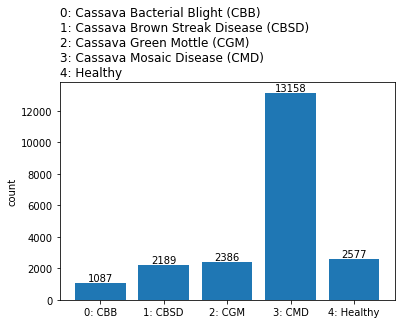

In [3]:
lbArray = np.array(df.loc[:, "label"])
uni, count = np.unique(lbArray, return_counts=True)
plt.bar(uni, count)
plt.ylabel("count")
plt.xticks(uni, [str(i) + ": " + labelDict[str(i)].split("(")[-1].split(")")[0] for i in range(5)])
plt.title("\n".join([str(i) + ": " + labelDict[str(i)] for i in range(5)]), loc="left")

for i in range(5):
    plt.text(uni[i], count[i], str(count[i]), ha="center", va="bottom")
plt.show()

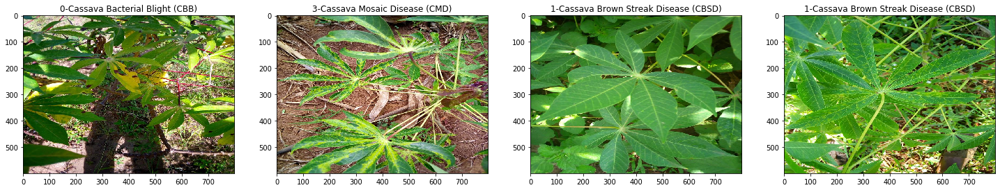

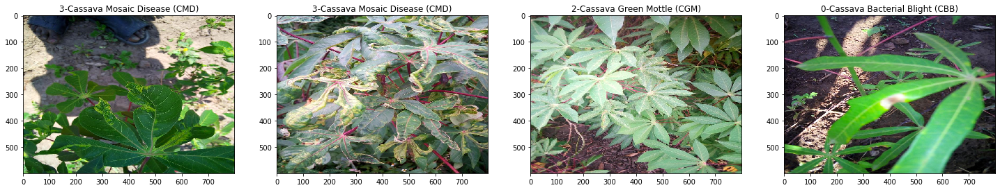

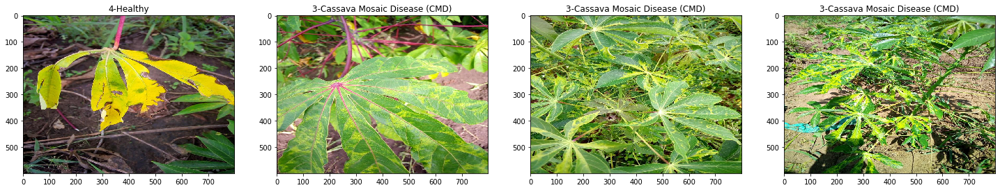

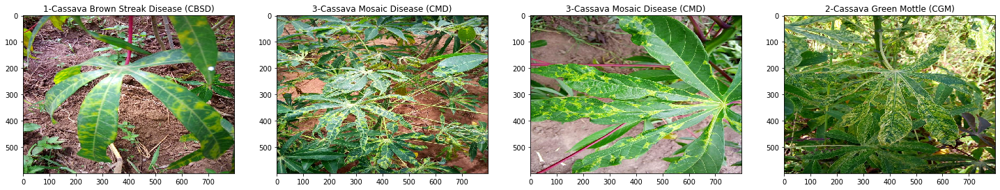

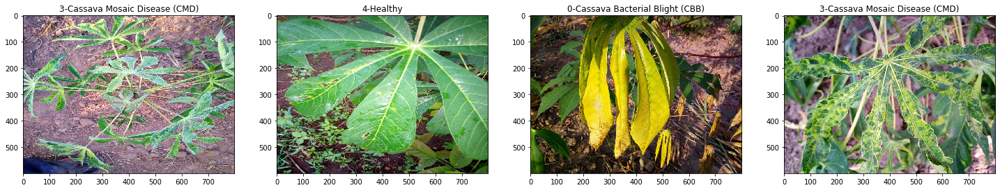

In [4]:
# 显示前20张图
for i in range(20):
    fName, label = df.loc[i, "image_id"], df.loc[i, "label"]
    # cv2读取的通道顺序是BGR，而plt.plot需输入RGB顺序，因此要调换一下
    img = cv2.imread(DATAPATH+"/train_images/"+fName, -1)[:, :, [2, 1, 0]]

    if i % 4 == 0:
        fig = plt.figure(figsize=(25, 5))
    plt.subplot(1, 4, i % 4 + 1)
    plt.imshow(img)
    plt.title(str(label) + "-" + labelDict[str(label)])
    if i % 4 == 3:
        plt.show()